In [45]:
import numpy as np 
import pandas as pd 

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import metrics
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
import warnings
from ydata_profiling import ProfileReport
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.preprocessing import MinMaxScaler as StandartScaler
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

import warnings
warnings.filterwarnings("ignore")


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))



/kaggle/input/daily-climate-time-series-data/DailyDelhiClimateTrain.csv
/kaggle/input/daily-climate-time-series-data/DailyDelhiClimateTest.csv
/kaggle/input/boston-house-prices/housing.csv


# **Ivan Bashtovyi**
#  lab 3
# Варіант 18

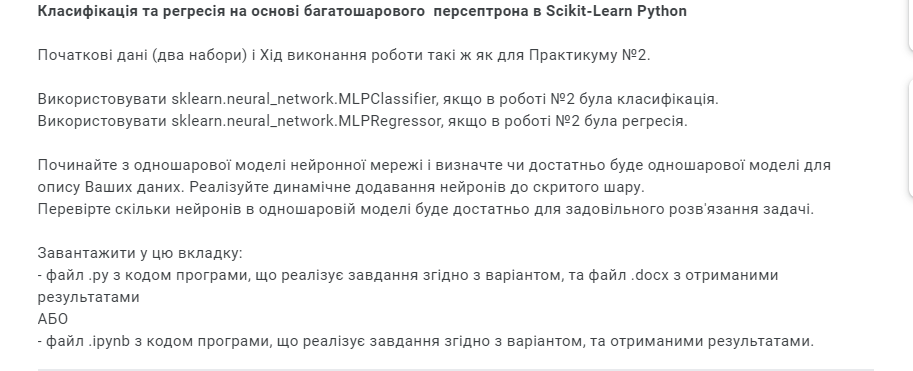

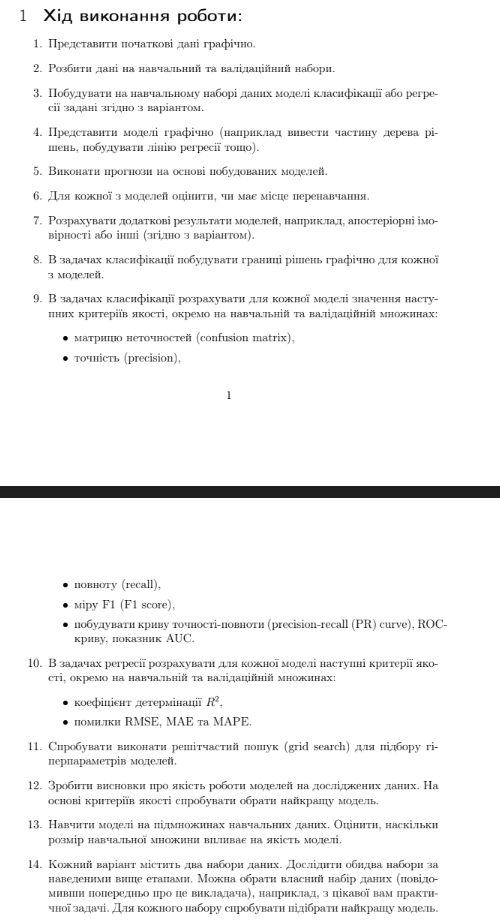

# **Boston house price**

# **Data Understanding**

In [46]:
column_names=['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']
features=['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT']
data= pd.read_csv('/kaggle/input/boston-house-prices/housing.csv',header=None, delimiter=r'\s+', names=column_names)
data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2


Features

CRIM: per capita crime rate by town

ZN: This feature represents the proportion of residential land zoned for lots over 25,000 sq.ft. It indicates the amount of land in each town that is designated for large residential lots.

INDUS: INDUS represents the proportion of non-retail business acres per town. It indicates the amount of land devoted to non-retail businesses, such as manufacturing or industrial activities, in each town.

CHAS: CHAS is a dummy variable that represents whether a town borders the Charles River or not. It takes a value of 1 if the town does border the river, and 0 otherwise.

NOX: NOX represents the concentration of nitric oxides (air pollution) in parts per 10 million. It measures the level of air pollution in each town.

RM: RM stands for average number of rooms per dwelling. It represents the average number of rooms in houses or apartments in each town.

AGE: AGE represents the proportion of owner-occupied units that were built prior to 1940. It indicates the age of the housing stock in each town, with higher values indicating a higher proportion of older homes.

DIS: DIS stands for weighted distances to five Boston employment centers. It represents the average distance from each town to five major employment centers in Boston, with lower values indicating closer proximity.

RAD: RAD is an index of accessibility to radial highways. It measures the accessibility of each town to radial highways, with higher values indicating better accessibility.

TAX: TAX represents the full-value property-tax rate per $10,000. It indicates the property tax rate for each town, with higher values indicating higher tax rates.

PTRATIO: PTRATIO represents the pupil-teacher ratio by town. It reflects the average number of students per teacher in the town's public schools.

B: Bk is the proportion of blacks by town

LSTAT: percent lower status of the population

(TARGET) MEDV: MEDV represents the median value of owner-occupied homes in $1000s. It indicates the median price of homes in each town, which is a commonly used measure of housing market values.

In [47]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.5 KB


In [48]:
data.shape

(506, 14)

In [49]:
data.duplicated().sum()

0

In [50]:
data.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [51]:
profile = ProfileReport(data, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Modeling**

In [52]:
x = data.drop('MEDV',axis=1)
y = data['MEDV']

In [53]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

In [54]:
x_train

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
478,10.23300,0.0,18.10,0,0.614,6.185,96.7,2.1705,24,666.0,20.2,379.70,18.03
37,0.08014,0.0,5.96,0,0.499,5.850,41.5,3.9342,5,279.0,19.2,396.90,8.77
326,0.30347,0.0,7.38,0,0.493,6.312,28.9,5.4159,5,287.0,19.6,396.90,6.15
480,5.82401,0.0,18.10,0,0.532,6.242,64.7,3.4242,24,666.0,20.2,396.90,10.74
395,8.71675,0.0,18.10,0,0.693,6.471,98.8,1.7257,24,666.0,20.2,391.98,17.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
304,0.05515,33.0,2.18,0,0.472,7.236,41.1,4.0220,7,222.0,18.4,393.68,6.93
443,9.96654,0.0,18.10,0,0.740,6.485,100.0,1.9784,24,666.0,20.2,386.73,18.85
175,0.06664,0.0,4.05,0,0.510,6.546,33.1,3.1323,5,296.0,16.6,390.96,5.33
336,0.03427,0.0,5.19,0,0.515,5.869,46.3,5.2311,5,224.0,20.2,396.90,9.80


In [55]:
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# **MLPRegressor with one layer + dynamic addition of neurons**


In [56]:
min_neurons = 1
max_neurons = 20  
best_mse = float('inf')
best_num_neurons = 1

for num_neurons in range(min_neurons, max_neurons + 1):
    
    model = MLPRegressor(hidden_layer_sizes=(num_neurons,), max_iter=1000, random_state=42)
    
    
    mse_scores = -cross_val_score(model, x_train, y_train, cv=5, scoring='neg_mean_squared_error')
    r2_scores = cross_val_score(model, x_train, y_train, cv=5, scoring='r2')
    mean_absolute_errors = -cross_val_score(model, x_train, y_train, cv=5, scoring='neg_mean_absolute_error')
    mean_absolute_percentage_errors = -cross_val_score(model, x_train, y_train, cv=5, scoring='neg_mean_absolute_percentage_error')
    
    mean_mse = mse_scores.mean()
    mean_r2 = r2_scores.mean()
    mean_mae = mean_absolute_errors.mean()
    mean_mape =  mean_absolute_percentage_errors.mean()                            
    
    print(f"number of neurons:{num_neurons}")
    print(f"Mean MSE score through cross validation:{mean_mse}")
    print(f"Mean R2 score through cross validation:{mean_r2}")
    print(f"Mean MAE score through cross validation:{mean_mae}")
    print(f"Mean MAPE score through cross validation:{mean_mape}")
    print()
    if mean_mse < best_mse:
        best_mse = mean_mse
        best_num_neurons = num_neurons

print(f"Optimal number of neurons in a single-layer model: {best_num_neurons}")


number of neurons:1
Mean MSE score through cross validation:633.6693115187061
Mean R2 score through cross validation:-6.273126210781149
Mean MAE score through cross validation:23.24056544371185
Mean MAPE score through cross validation:1.0230608276070012

number of neurons:2
Mean MSE score through cross validation:51.60841510700097
Mean R2 score through cross validation:0.4125220670367532
Mean MAE score through cross validation:5.393698989373087
Mean MAPE score through cross validation:0.2645255126208822

number of neurons:3
Mean MSE score through cross validation:41.48917909804601
Mean R2 score through cross validation:0.5313122454574168
Mean MAE score through cross validation:4.7765697305079655
Mean MAPE score through cross validation:0.23470856930435485

number of neurons:4
Mean MSE score through cross validation:537.0701428000632
Mean R2 score through cross validation:-5.149397271530599
Mean MAE score through cross validation:21.13353447717443
Mean MAPE score through cross validatio

In [57]:
final_model = MLPRegressor(hidden_layer_sizes=(best_num_neurons,), max_iter=1000, random_state=42)
final_model.fit(x_train, y_train)

y_pred_test = final_model.predict(x_test)
y_pred_train = final_model.predict(x_train)

In [87]:
print("Train set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_train, y_train)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_train, y_train)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_train, y_train)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_percentage_error(y_pred_train, y_train)))

print()

print("Test set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_test, y_test)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_test, y_test)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_test, y_test)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_percentage_error(y_pred_test, y_test)))

Train set:
Mean squared error Score: 2.2935
R-squared Score: 0.9557
Mean Absolute Error : 1.1580
Mean Absolute Percentage Error : 0.0527%

Test set:
Mean squared error Score: 3.9441
R-squared Score: 0.9259
Mean Absolute Error : 1.4652
Mean Absolute Percentage Error : 0.0647%


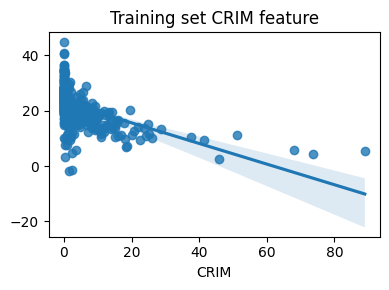

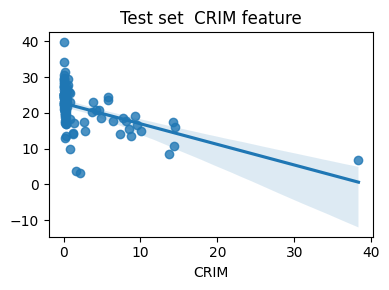

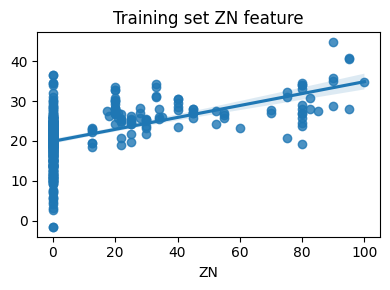

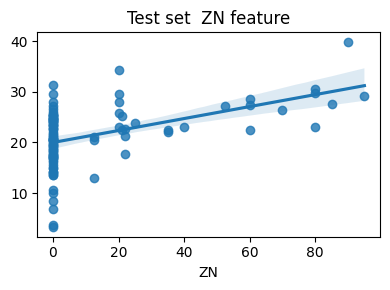

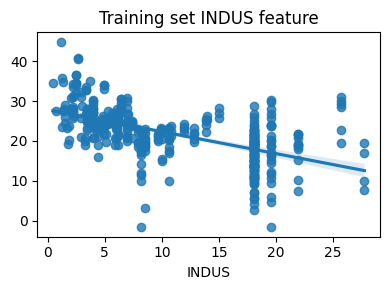

...

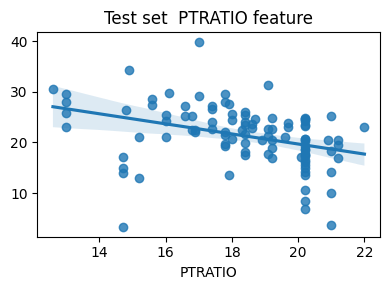

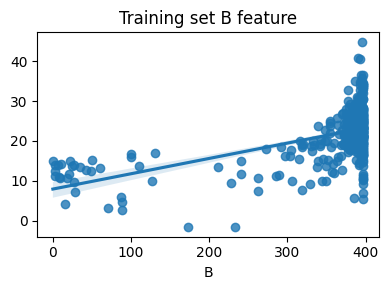

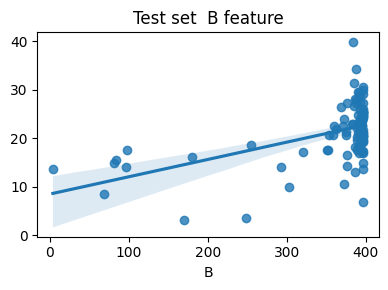

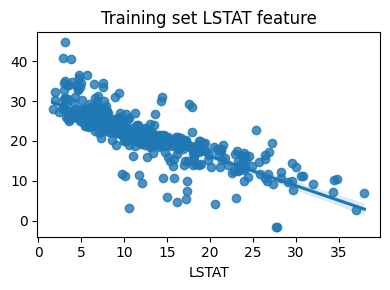

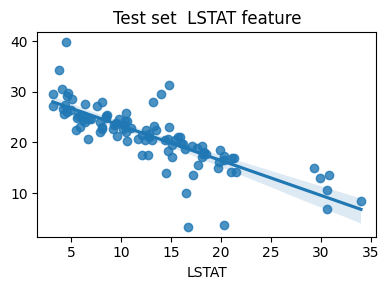

In [59]:
for name in features :
    # Training set
    plt.figure(figsize=(4, 3))
    plt.title(f"Training set {name} feature")
    sns.regplot(x=x_train[name], y=y_pred_train);
    plt.axis("tight")
    plt.tight_layout()
    
    # Test set
    plt.figure(figsize=(4, 3))
    plt.title(f"Test set  {name} feature")
    sns.regplot(x=x_test[name], y=y_pred_test);
    plt.axis("tight")
    plt.tight_layout()

# Model trained on 10% of data

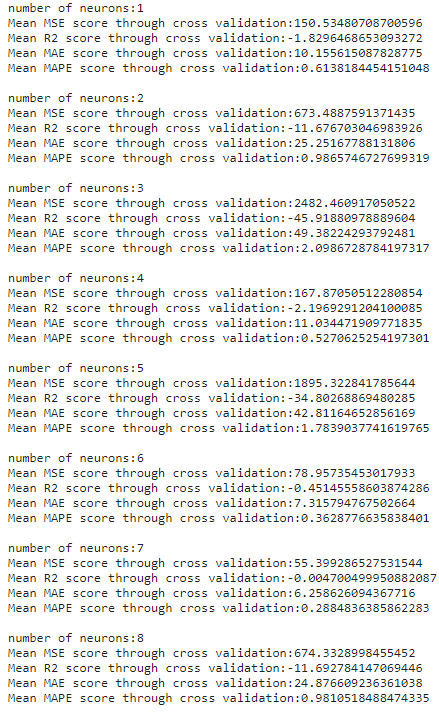

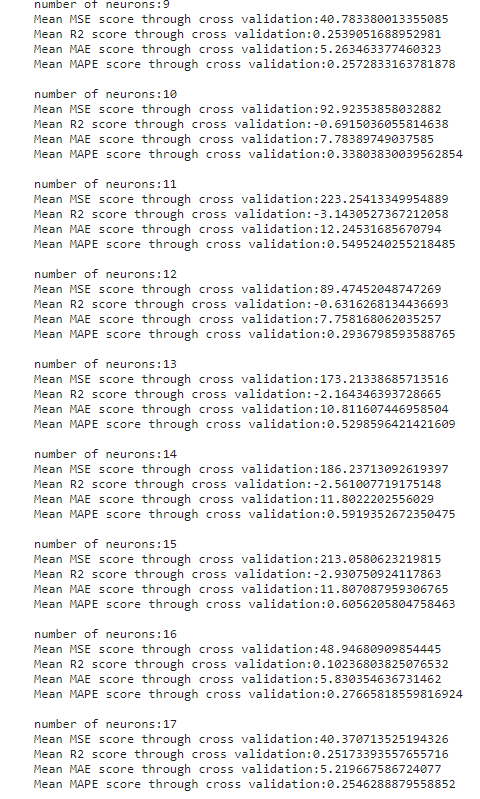

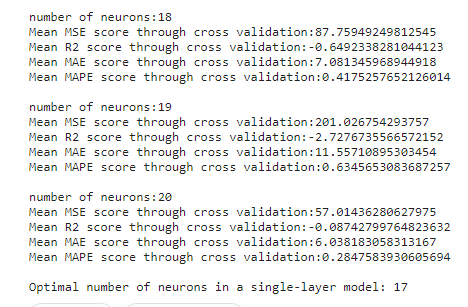

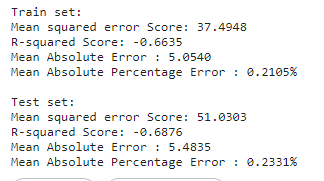

# **MLPRegressor hyperparams tuning**

In [60]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(solver='lbfgs', max_iter=1000, random_state=42))
])

param_grid = {
    'mlp__hidden_layer_sizes': [(10, 10), (20, 20), (30, 30)],
    'mlp__activation': ['relu', 'tanh'],
    'mlp__alpha': [0.0001, 0.001, 0.01],
    'mlp__solver': ['lbfgs', 'adam']
}

In [61]:
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

grid_search.fit(x_train, y_train)

best_model = grid_search.best_estimator_

y_pred_test = best_model.predict(x_test)
y_pred_train = best_model.predict(x_train)

/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS R

In [62]:
mse = mean_squared_error(y_test, y_pred_test)
print("Best Model - Mean Squared Error:", mse)

best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Model - Mean Squared Error: 12.340753934973483
Best Hyperparameters: {'mlp__activation': 'relu', 'mlp__alpha': 0.01, 'mlp__hidden_layer_sizes': (30, 30), 'mlp__solver': 'adam'}


In [63]:
grid_search.best_params_

{'mlp__activation': 'relu',
 'mlp__alpha': 0.01,
 'mlp__hidden_layer_sizes': (30, 30),
 'mlp__solver': 'adam'}

In [64]:
print("Train set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_train, y_train)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_train, y_train)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_train, y_train)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_train, y_train)))

print()

print("Test set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_test, y_test)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_test, y_test)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_test, y_test)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_test, y_test)))

Train set:
Mean squared error Score: 12.2415
R-squared Score: 0.8328
Mean Absolute Error : 2.4157
Mean Absolute Percentage Error : 2.4157%

Test set:
Mean squared error Score: 12.3408
R-squared Score: 0.8007
Mean Absolute Error : 2.7993
Mean Absolute Percentage Error : 2.7993%


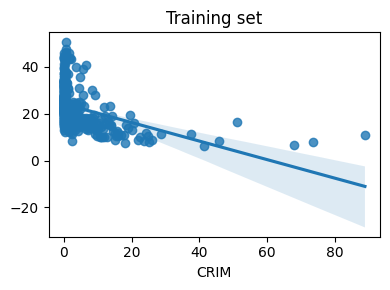

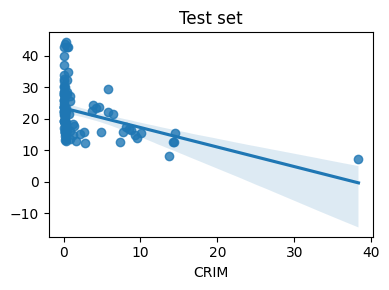

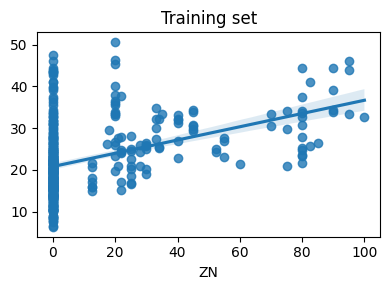

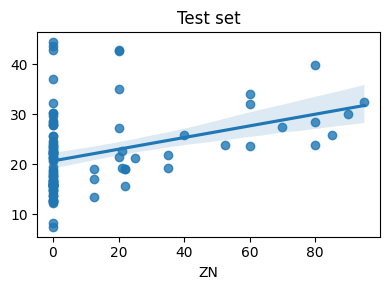

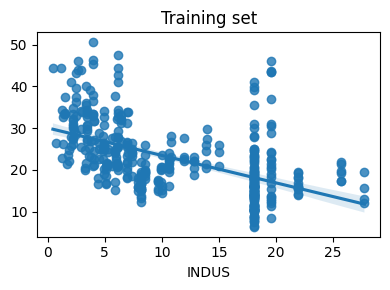

...

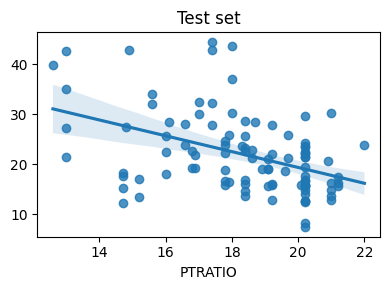

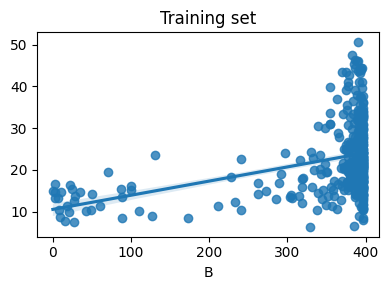

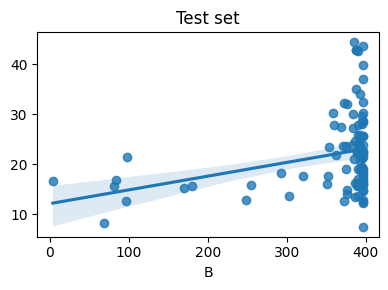

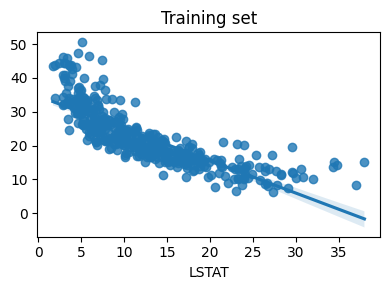

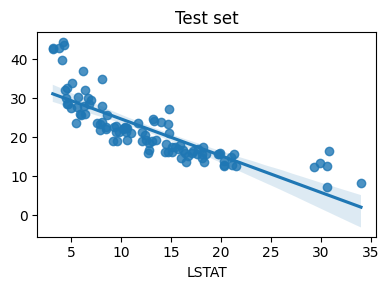

In [65]:
for name in features :
    # Training set
    plt.figure(figsize=(4, 3))
    plt.title("Training set")
    sns.regplot(x=x_train[name], y=y_pred_train);
    plt.axis("tight")
    plt.tight_layout()

    # Test set
    plt.figure(figsize=(4, 3))
    plt.title("Test set")
    sns.regplot(x=x_test[name], y=y_pred_test);
    plt.axis("tight")
    plt.tight_layout()

# **Trained on 10% of data**

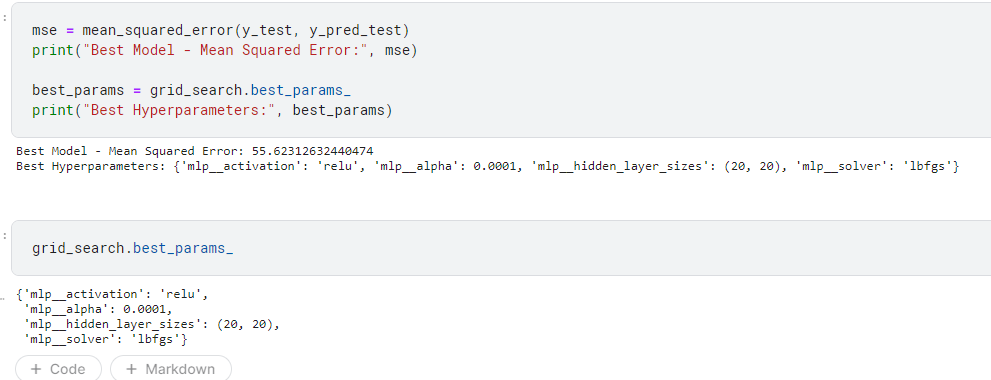

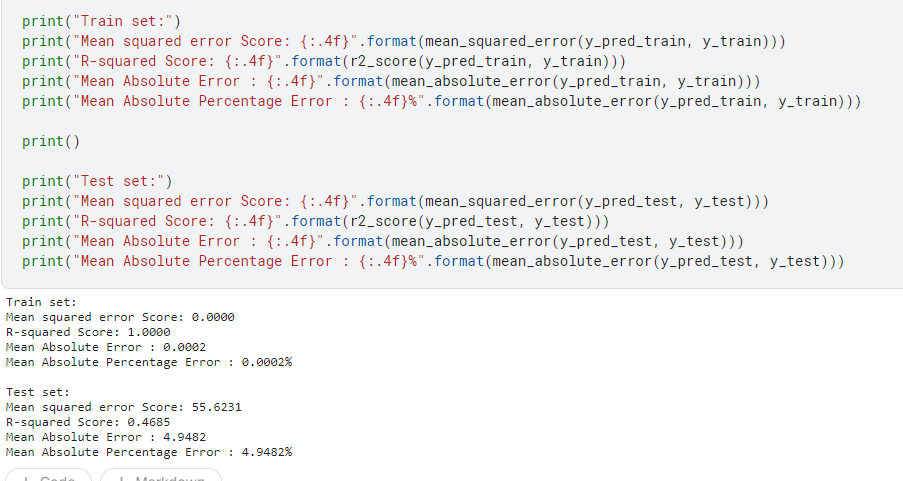

# **Daily climate time series data**

In [66]:
data = pd.read_csv("/kaggle/input/daily-climate-time-series-data/DailyDelhiClimateTrain.csv")
data.head()

,date,meantemp,humidity,wind_speed,meanpressure
0,2013-01-01,10.000000,84.500000,0.000000,1015.666667
1,2013-01-02,7.400000,92.000000,2.980000,1017.800000
2,2013-01-03,7.166667,87.000000,4.633333,1018.666667
3,2013-01-04,8.666667,71.333333,1.233333,1017.166667
4,2013-01-05,6.000000,86.833333,3.700000,1016.500000


In [67]:
features = data.drop(['meantemp', 'date'], axis = 1).columns
features

Index(['humidity', 'wind_speed', 'meanpressure'], dtype='object')

In [68]:
profile = ProfileReport(data, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Entry data visualizations**

In [69]:
data['date'] = pd.to_datetime(data['date'])


data['day'] = data['date'].dt.day
data['hour'] = data['date'].dt.hour
data['month'] = data['date'].dt.month

In [70]:
data.head()

,date,meantemp,humidity,wind_speed,meanpressure,day,hour,month
0,2013-01-01,10.000000,84.500000,0.000000,1015.666667,1,0,1
1,2013-01-02,7.400000,92.000000,2.980000,1017.800000,2,0,1
2,2013-01-03,7.166667,87.000000,4.633333,1018.666667,3,0,1
3,2013-01-04,8.666667,71.333333,1.233333,1017.166667,4,0,1
4,2013-01-05,6.000000,86.833333,3.700000,1016.500000,5,0,1


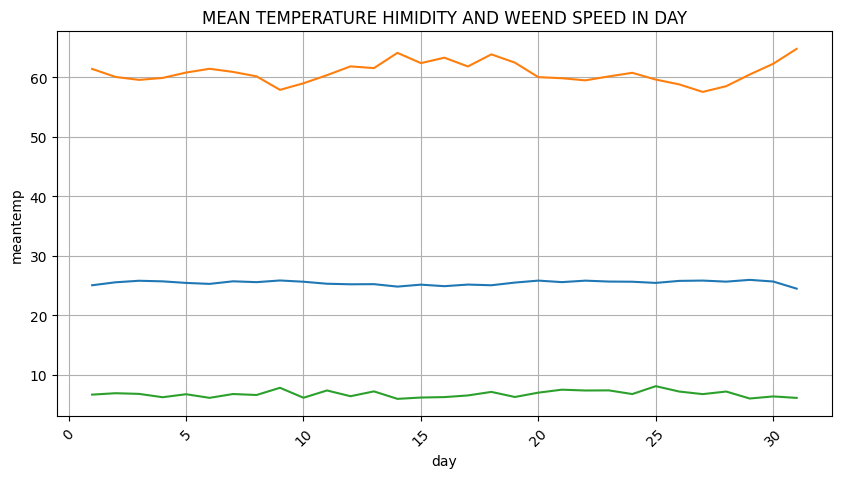

In [71]:
plt.figure(figsize=(10,5))
plt.title("MEAN TEMPERATURE HIMIDITY AND WEEND SPEED IN DAY")
sns.lineplot(data.groupby(by="day")['meantemp'].mean())
sns.lineplot(data.groupby(by="day")['humidity'].mean())
sns.lineplot(data.groupby(by="day")['wind_speed'].mean())
plt.xticks(rotation=45)
plt.grid()
plt.show()

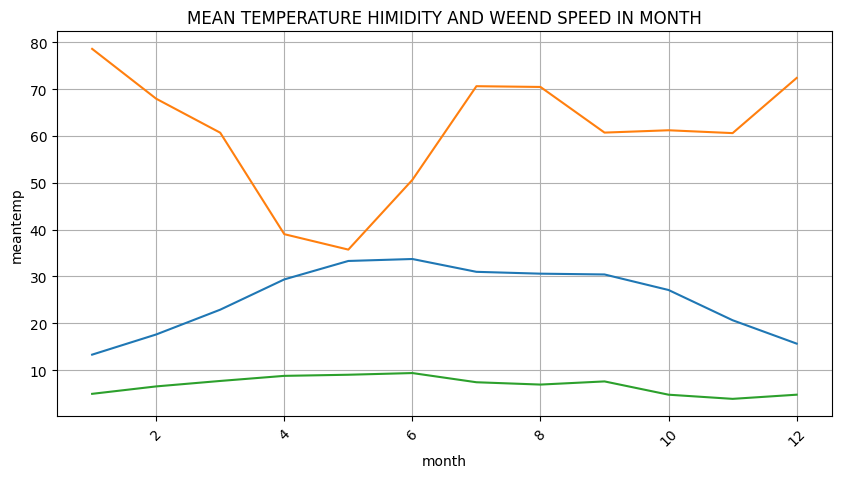

In [72]:
plt.figure(figsize=(10,5))
plt.title("MEAN TEMPERATURE HIMIDITY AND WEEND SPEED IN MONTH")
sns.lineplot(data.groupby(by="month")['meantemp'].mean())
sns.lineplot(data.groupby(by="month")['humidity'].mean())
sns.lineplot(data.groupby(by="month")['wind_speed'].mean())
plt.xticks(rotation=45)
plt.grid()
plt.show()

In [73]:
tempdata=data[['meantemp']]

tempdata.index=pd.to_datetime(data.date)

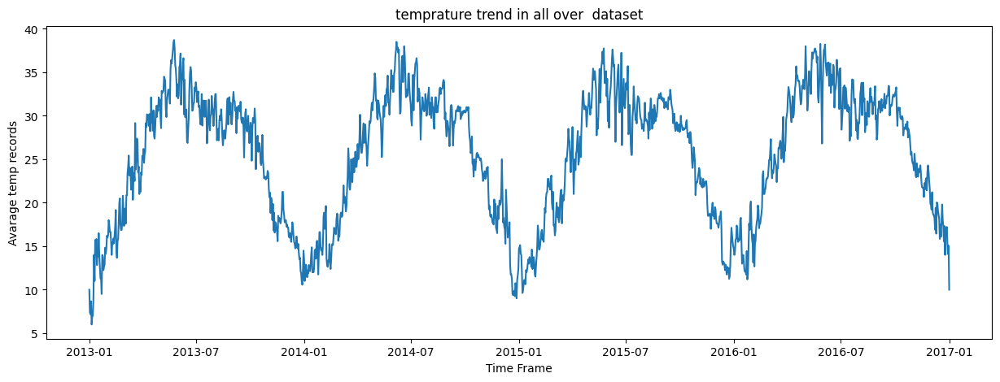

In [74]:
plt.figure(figsize=(15,5))
plt.xlabel("Time Frame")
plt.ylabel("Avarage temp records")
plt.title("temprature trend in all over  dataset")
plt.plot(tempdata)
plt.show()

# **Modeling**

In [75]:
x=data.drop(['meantemp','date'],axis=1)
y=data['meantemp']

In [95]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.8)

# **MLPRegressor with one layer + dynamic addition of neurons**


In [96]:
min_neurons = 1
max_neurons = 20  
best_mse = float('inf')
best_num_neurons = 1

for num_neurons in range(min_neurons, max_neurons + 1):
    
    model = MLPRegressor(hidden_layer_sizes=(num_neurons,), max_iter=1000, random_state=42)
    
    
    mse_scores = -cross_val_score(model, x_train, y_train, cv=5, scoring='neg_mean_squared_error')
    r2_scores = cross_val_score(model, x_train, y_train, cv=5, scoring='r2')
    mean_absolute_errors = -cross_val_score(model, x_train, y_train, cv=5, scoring='neg_mean_absolute_error')
    mean_absolute_percentage_errors = -cross_val_score(model, x_train, y_train, cv=5, scoring='neg_mean_absolute_percentage_error')
    
    mean_mse = mse_scores.mean()
    mean_r2 = r2_scores.mean()
    mean_mae = mean_absolute_errors.mean()
    mean_mape =  mean_absolute_percentage_errors.mean()                            
    
    print(f"number of neurons:{num_neurons}")
    print(f"Mean MSE score through cross validation:{mean_mse}")
    print(f"Mean R2 score through cross validation:{mean_r2}")
    print(f"Mean MAE score through cross validation:{mean_mae}")
    print(f"Mean MAPE score through cross validation:{mean_mape}")
    print()
    if mean_mse < best_mse:
        best_mse = mean_mse
        best_num_neurons = num_neurons

print(f"Optimal number of neurons in a single-layer model: {best_num_neurons}")


number of neurons:1
Mean MSE score through cross validation:965.6712978825963
Mean R2 score through cross validation:-17.499192959984207
Mean MAE score through cross validation:14.415373287555866
Mean MAPE score through cross validation:0.5925385763330687

number of neurons:2
Mean MSE score through cross validation:634.0898585299467
Mean R2 score through cross validation:-11.038802112439381
Mean MAE score through cross validation:24.08153625129441
Mean MAPE score through cross validation:0.9376370524569391

number of neurons:3
Mean MSE score through cross validation:519.9019170122142
Mean R2 score through cross validation:-8.874461587569124
Mean MAE score through cross validation:21.498618993334187
Mean MAPE score through cross validation:0.8216579246904988

number of neurons:4
Mean MSE score through cross validation:203.41617524791792
Mean R2 score through cross validation:-2.8387713990102785
Mean MAE score through cross validation:11.502815567500132
Mean MAPE score through cross vali

In [97]:
final_model = MLPRegressor(hidden_layer_sizes=(best_num_neurons,), max_iter=1000, random_state=42)
final_model.fit(x_train, y_train)

MLPRegressor(hidden_layer_sizes=(6,), max_iter=1000, random_state=42)

In [98]:

y_pred_test = final_model.predict(x_test)
y_pred_train = final_model.predict(x_train)

In [99]:

print("Train set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_train, y_train)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_train, y_train)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_train, y_train)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_percentage_error(y_pred_train, y_train)))

print()

print("Test set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_test, y_test)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_test, y_test)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_test, y_test)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_percentage_error(y_pred_test, y_test)))

Train set:
Mean squared error Score: 49.4268
R-squared Score: -1.1736
Mean Absolute Error : 5.6471
Mean Absolute Percentage Error : 0.2354%

Test set:
Mean squared error Score: 49.7041
R-squared Score: -1.5119
Mean Absolute Error : 5.7470
Mean Absolute Percentage Error : 0.2462%


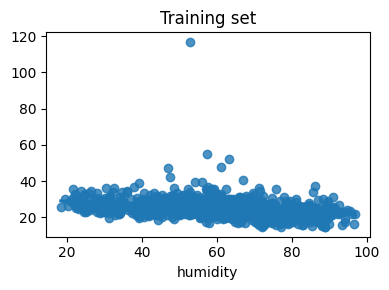

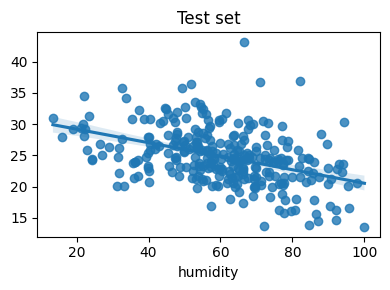

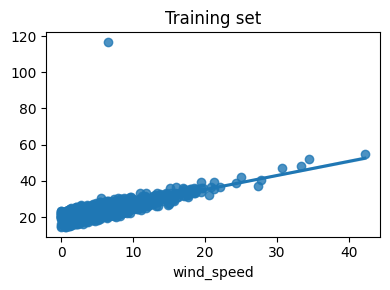

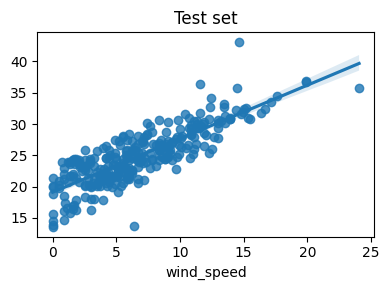

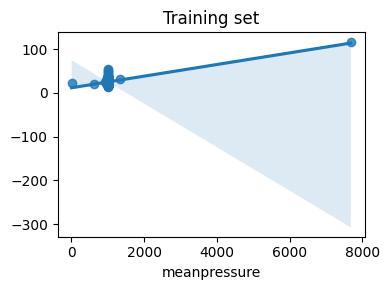

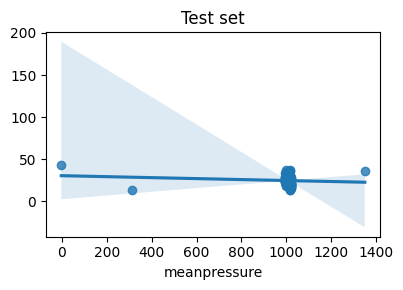

In [81]:
for name in features :
    # Training set
    plt.figure(figsize=(4, 3))
    plt.title("Training set")
    sns.regplot(x=x_train[name], y=y_pred_train);
    plt.axis("tight")
    plt.tight_layout()

    # Test set
    plt.figure(figsize=(4, 3))
    plt.title("Test set")
    sns.regplot(x=x_test[name], y=y_pred_test);
    plt.axis("tight")
    plt.tight_layout()

# Model trained on 10% of data

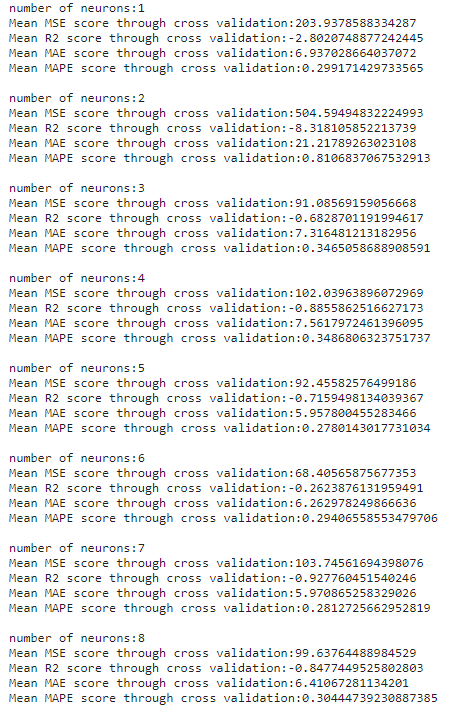

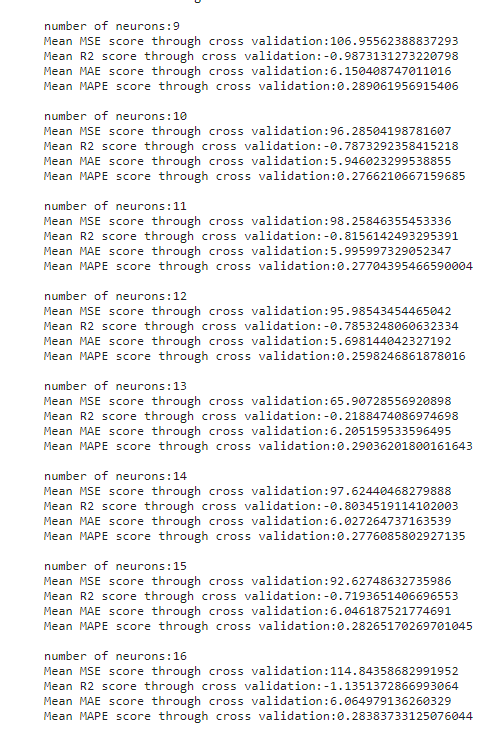

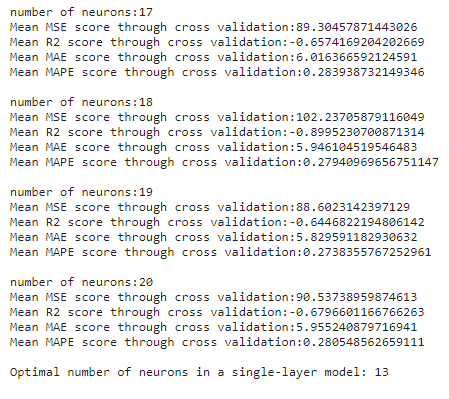

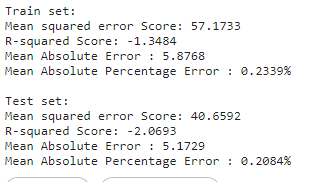

# **MLPRegressor hyperparams tuning**

In [82]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(solver='lbfgs', max_iter=1000, random_state=42))
])

param_grid = {
    'mlp__hidden_layer_sizes': [(10, 10), (20, 20), (30, 30)],
    'mlp__activation': ['relu', 'tanh'],
    'mlp__alpha': [0.0001, 0.001, 0.01],
    'mlp__solver': ['lbfgs', 'adam']
}

In [83]:
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

grid_search.fit(x_train, y_train)

best_model = grid_search.best_estimator_

y_pred_test = best_model.predict(x_test)
y_pred_train = best_model.predict(x_train)

/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS R

In [84]:
mse = mean_squared_error(y_test, y_pred_test)
print("Best Model - Mean Squared Error:", mse)

best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Model - Mean Squared Error: 3.944053377219349
Best Hyperparameters: {'mlp__activation': 'tanh', 'mlp__alpha': 0.001, 'mlp__hidden_layer_sizes': (10, 10), 'mlp__solver': 'lbfgs'}


In [85]:
print("Train set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_train, y_train)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_train, y_train)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_train, y_train)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_train, y_train)))

print()

print("Test set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_test, y_test)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_test, y_test)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_test, y_test)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_test, y_test)))

Train set:
Mean squared error Score: 2.2935
R-squared Score: 0.9557
Mean Absolute Error : 1.1580
Mean Absolute Percentage Error : 1.1580%

Test set:
Mean squared error Score: 3.9441
R-squared Score: 0.9259
Mean Absolute Error : 1.4652
Mean Absolute Percentage Error : 1.4652%


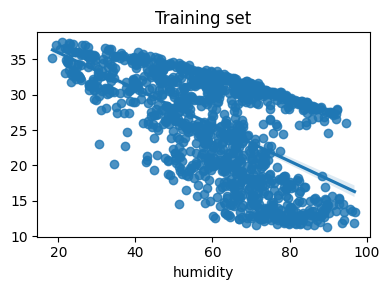

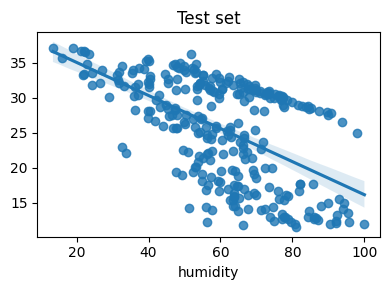

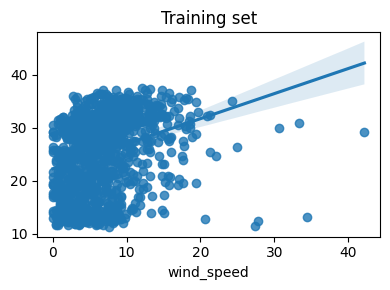

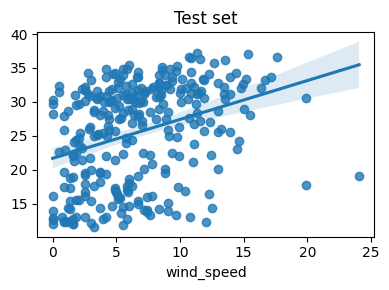

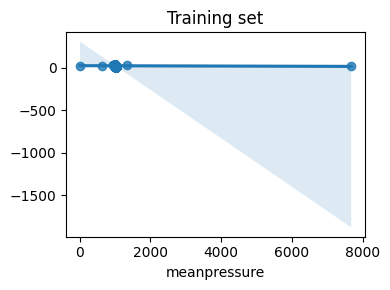

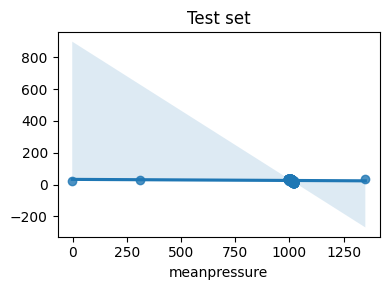

In [86]:
for name in features :
    # Training set
    plt.figure(figsize=(4, 3))
    plt.title("Training set")
    sns.regplot(x=x_train[name], y=y_pred_train);
    plt.axis("tight")
    plt.tight_layout()

    # Test set
    plt.figure(figsize=(4, 3))
    plt.title("Test set")
    sns.regplot(x=x_test[name], y=y_pred_test);
    plt.axis("tight")
    plt.tight_layout()

# Model trained on 10% of data

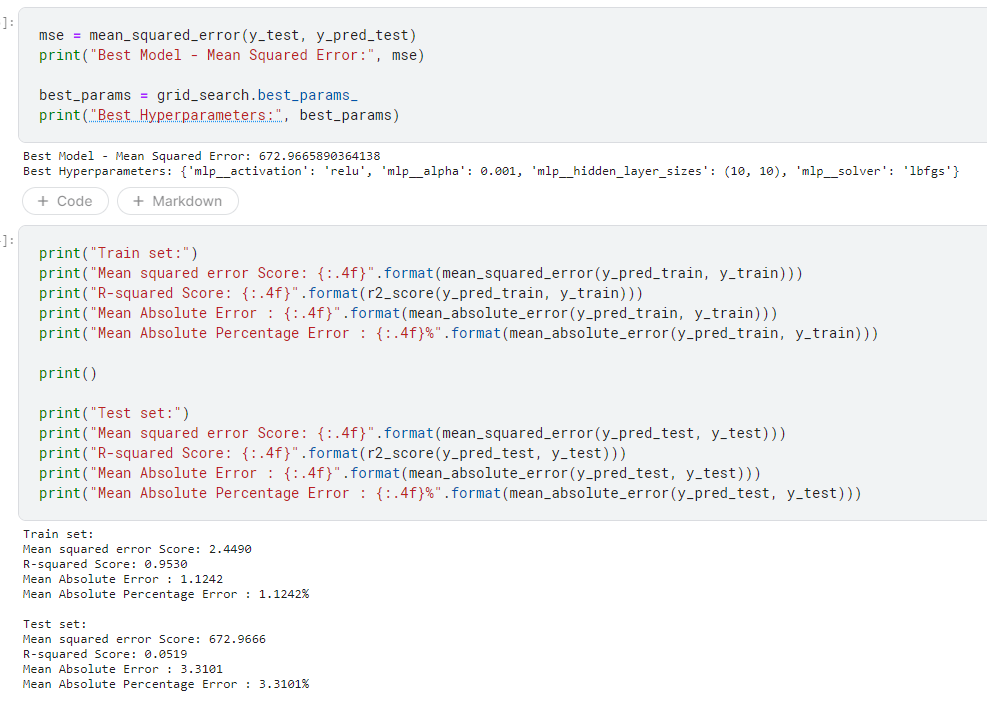